In [1]:
# Importing libraries
import datetime
import pandas as pd
import requests
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import plotly.express as px

mpl.rcParams['figure.figsize'] = (10,8)
mpl.rcParams['axes.grid'] = False

In [2]:
# Importing data
energy = pd.read_csv('data/nyc_energy_consumption.csv')

In [3]:
# Converting timstamp to datetime object
energy['timeStamp']= pd.to_datetime(energy['timeStamp'])

In [4]:
energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timeStamp  49205 non-null  datetime64[ns]
 1   demand     49124 non-null  float64       
 2   precip     48975 non-null  float64       
 3   temp       49019 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.5 MB


In [5]:
energy.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


In [6]:
# Visualizing demand
fig = px.line(energy, x='timeStamp', y='demand', title='NYC_Energy_Consumption')

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons=list([
                        dict(count=1, label='1m', step='month', stepmode="backward"),
                        dict(count=2, label='6m', step='month', stepmode="backward"),
                        dict(count=3, label='6mYTD', step='month', stepmode="todate"),
                        dict(count=4, label='2y', step='year', stepmode="backward"),
                        dict(count=5, label='3y', step='year', stepmode="backward"),
                        dict(step='all')
                            ])        
                        )
                   )
fig.show()

In [7]:
# Setting timestamp as indx for easier time series analysis
ny_df = energy.set_index('timeStamp')
ny_df.head()

,demand,precip,temp
timeStamp,,,
2012-01-01 00:00:00,4937.5,0.0,46.13
2012-01-01 01:00:00,4752.1,0.0,45.89
2012-01-01 02:00:00,4542.6,0.0,45.04
2012-01-01 03:00:00,4357.7,0.0,45.03
2012-01-01 04:00:00,4275.5,0.0,42.61


array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F5FDC1AD08>,
      dtype=object)

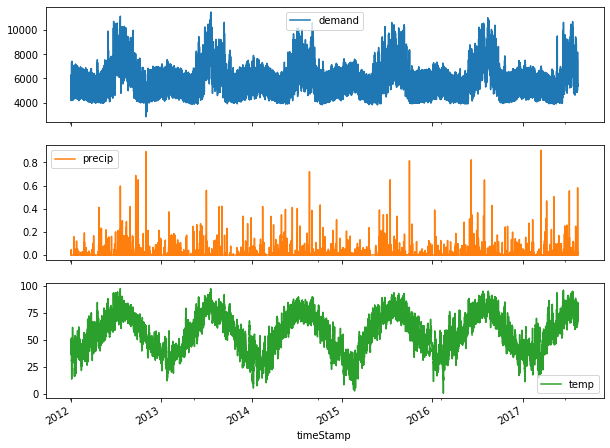

In [8]:
# Visualizing the data
ny_df.plot(subplots=True)

array([<matplotlib.axes._subplots.AxesSubplot object at 0x000001F5FDBCDF88>,
      dtype=object)

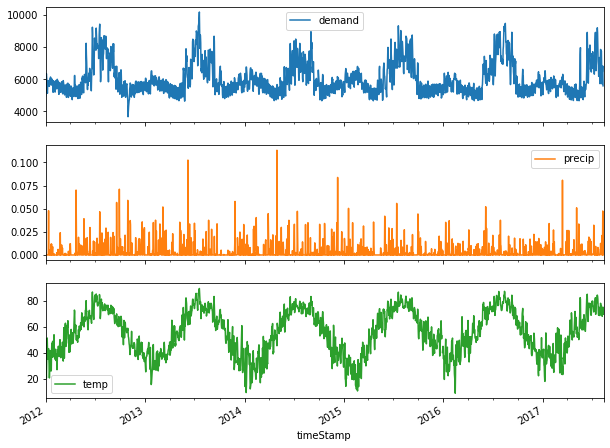

In [9]:
# Resampling at daily level
ny_df.resample('D').mean().plot(subplots=True)

In [10]:
# Creating a daily sampled dataframe
ny_df_daily = ny_df.resample('D').mean()

In [11]:
# Importing Prophet library
from fbprophet import Prophet

### Univariate Modeling using Demand

In [12]:
# Changing the dataframe for Prophet with ds and y columns
ny_df_final = ny_df_daily.reset_index()[['timeStamp','demand']].rename({'timeStamp':'ds','demand':'y'}, axis='columns')

In [13]:
ny_df_final.head()

,ds,y
0,2012-01-01,4954.833333
1,2012-01-02,5302.954167
2,2012-01-03,6095.512500
3,2012-01-04,6336.266667
4,2012-01-05,6130.245833


In [14]:
# Creating training and test set
train = ny_df_final[(ny_df_final['ds']>='2012-01-01') & (ny_df_final['ds']<='2017-04-30')]
test = ny_df_final[(ny_df_final['ds']>'2017-04-30')]

In [15]:
print(train.shape)
print(test.shape)

(1947, 2)
(104, 2)


In [16]:
# Modeling the data with confidence interval 0.95
model1 = Prophet(interval_width=0.95, yearly_seasonality=True)

In [17]:
# Fitting the model to training data
model1.fit(train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [18]:
model1.params

OrderedDict([('k', array([[0.08595257]])),
             ('m', array([[0.59374945]])),
             ('delta',
              array([[-6.33858637e-08, -1.90547086e-05, -1.00535533e-01,
                      -5.78076397e-07,  6.44775818e-11,  1.88828742e-08,
                       3.91974159e-08, -3.01463834e-08, -2.03954325e-07,
                      -1.29907008e-08, -2.75044009e-02, -7.06790158e-02,
                      -8.42375967e-04, -8.13331863e-08,  2.36800777e-01,
                       7.56481624e-03,  2.00110172e-07, -9.23195136e-02,
                      -5.16563271e-02,  5.29329477e-08, -4.80089378e-08,
                       9.74313896e-08,  1.13641393e-02,  5.91529564e-03,
                       1.14883552e-07]])),
             ('sigma_obs', array([[0.04598931]])),
             ('beta',
              array([[-0.03464173, -0.07052822,  0.05759362,  0.04706025, -0.01407079,
                      -0.00500229, -0.00387182, -0.00073864,  0.00241469, -0.00755862,
                 

In [19]:
# Creating a dataframe for next 104 periods i.e. size of test data
future = model1.make_future_dataframe(periods=104)
future.tail()

,ds
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10
2049,2017-08-11
2050,2017-08-12


In [20]:
# Forecasting for future data
forecast = model1.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2046,2017-08-08,7589.503098,6631.062497,8472.850562
2047,2017-08-09,7578.625399,6623.999296,8477.591354
2048,2017-08-10,7533.349465,6595.169885,8402.784778
2049,2017-08-11,7488.574042,6615.364544,8410.617038
2050,2017-08-12,6913.751333,5991.397688,7776.374969


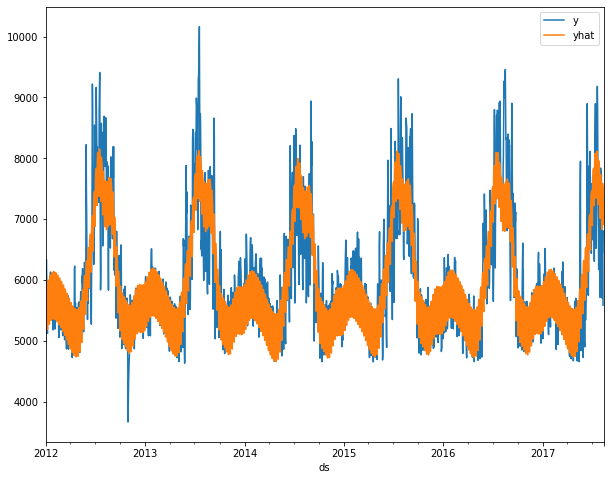

In [21]:
# Comparing actual and forecasted values
pd.concat([ny_df_final.set_index('ds')['y'], forecast.set_index('ds')['yhat']],axis=1).plot()

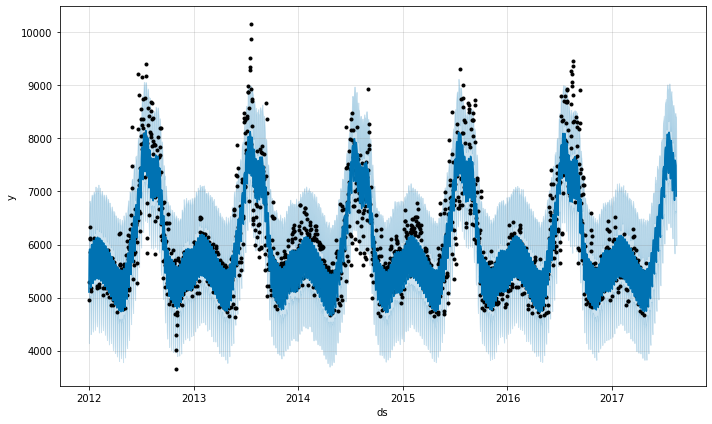

In [22]:
fig1 = model1.plot(forecast)
#95% Confidence interval is the light blue color
#the black dots are actual values 
#the dark blue is the y_hat or forecasted values

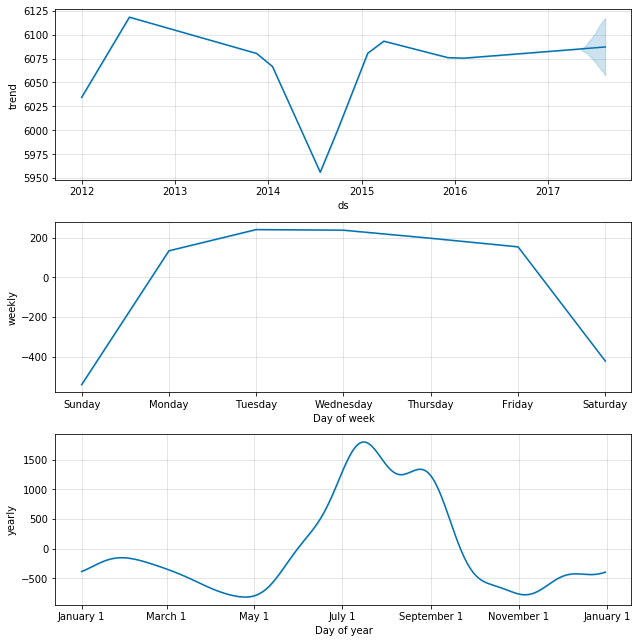

In [23]:
fig2 = model1.plot_components(forecast)

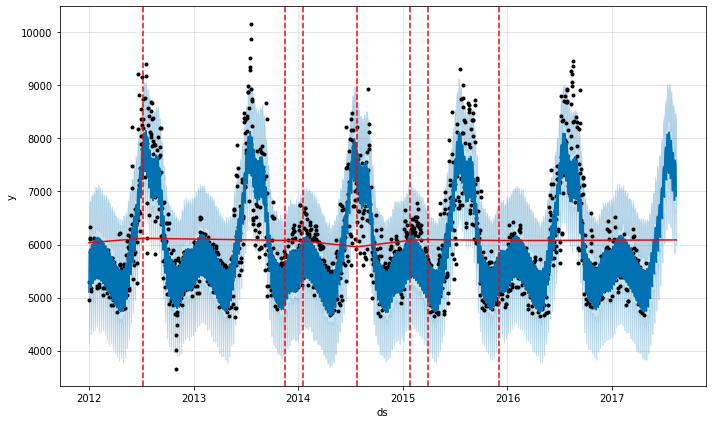

In [24]:
# Visualizing changepoints
from fbprophet.plot import add_changepoints_to_plot
fig = model1.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model1, forecast)

In [25]:
deltas = model1.params['delta'].mean(0)
deltas

array([-6.33858637e-08, -1.90547086e-05, -1.00535533e-01, -5.78076397e-07,
        6.44775818e-11,  1.88828742e-08,  3.91974159e-08, -3.01463834e-08,
       -2.03954325e-07, -1.29907008e-08, -2.75044009e-02, -7.06790158e-02,
       -8.42375967e-04, -8.13331863e-08,  2.36800777e-01,  7.56481624e-03,
        2.00110172e-07, -9.23195136e-02, -5.16563271e-02,  5.29329477e-08,
       -4.80089378e-08,  9.74313896e-08,  1.13641393e-02,  5.91529564e-03,
        1.14883552e-07])

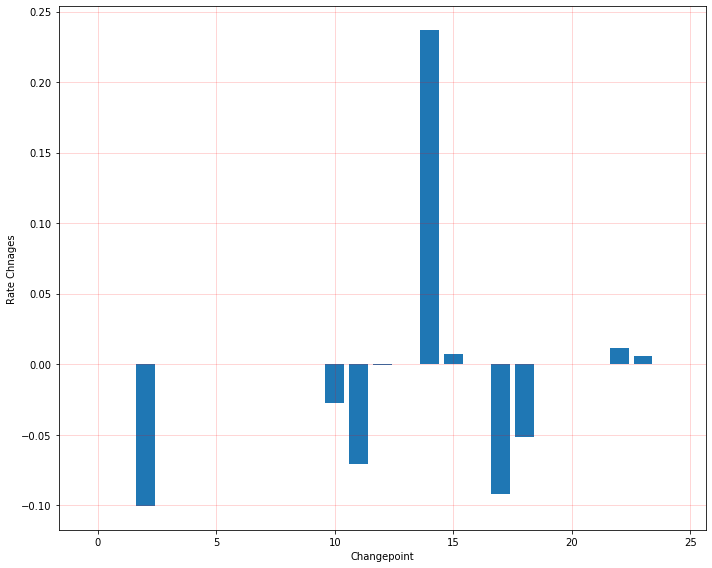

In [26]:
# Visualizing changepoints rate
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111)
ax.bar(range(len(deltas)), deltas)
ax.grid(True,which='major', c='red', ls='-', alpha=0.2)
ax.set_ylabel('Rate Chnages')
ax.set_xlabel('Changepoint')
fig.tight_layout()
#Prophet plots around 25 change points

In [27]:
# Changepoint dates
model1.changepoints

62     2012-03-03
124    2012-05-04
187    2012-07-06
249    2012-09-06
311    2012-11-07
373    2013-01-08
436    2013-03-12
498    2013-05-13
560    2013-07-14
622    2013-09-14
685    2013-11-16
747    2014-01-17
809    2014-03-20
871    2014-05-21
934    2014-07-23
996    2014-09-23
1058   2014-11-24
1120   2015-01-25
1183   2015-03-29
1245   2015-05-30
1307   2015-07-31
1369   2015-10-01
1432   2015-12-03
1494   2016-02-03
1556   2016-04-05
Name: ds, dtype: datetime64[ns]

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


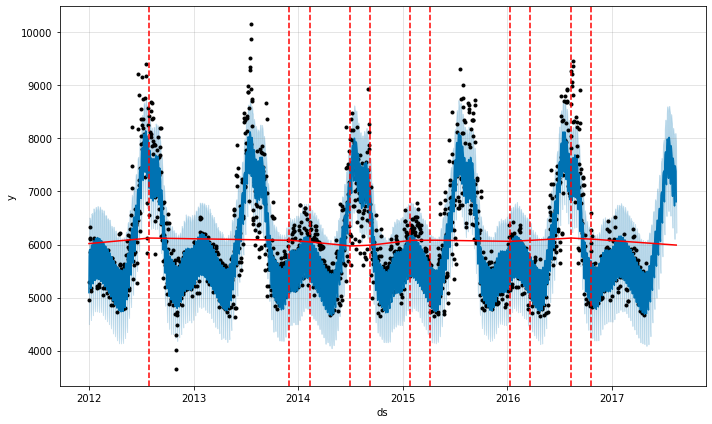

In [28]:
# Visualizing chnagepoints for 90%
pro_change = Prophet(changepoint_range=0.9, yearly_seasonality=True)
forecast = pro_change.fit(train).predict(future)
fig = pro_change.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), pro_change, forecast)

In [29]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

fig = plot_plotly(model1, forecast) #this returns the plotly figure
py.iplot(fig)

In [30]:
# Diagnostics
from fbprophet.diagnostics import cross_validation
cv_results = cross_validation(model=model1, initial='731 days', horizon='365 days')

INFO:fbprophet:Making 5 forecasts with cutoffs between 2014-05-01 00:00:00 and 2016-04-30 00:00:00


In [31]:
cv_results.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2014-05-02,5565.163424,4770.136267,6354.089149,5460.325000,2014-05-01
1,2014-05-03,4975.296264,4153.418092,5788.567706,4893.683333,2014-05-01
2,2014-05-04,4851.558917,4020.540701,5660.175441,4764.137500,2014-05-01
3,2014-05-05,5532.583407,4671.139092,6286.457014,5406.762500,2014-05-01
4,2014-05-06,5627.631037,4804.377485,6424.635676,5409.750000,2014-05-01


In [32]:
# Metrics
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(cv_results)
df_p

,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days 12:00:00,253807.248160,503.792862,407.863449,0.073333,0.065510,0.884615
1,37 days 00:00:00,260617.406920,510.507010,415.287656,0.074624,0.066499,0.879121
2,37 days 12:00:00,262937.351488,512.774172,418.653948,0.075203,0.067370,0.879121
3,38 days 00:00:00,265762.219978,515.521309,421.752495,0.075465,0.067931,0.879121
4,38 days 12:00:00,269477.241829,519.111974,426.961881,0.076295,0.068351,0.879121
...,...,...,...,...,...,...,...
653,363 days 00:00:00,267571.679683,517.273312,454.336115,0.083881,0.083356,0.983516
654,363 days 12:00:00,269248.324654,518.891438,455.352239,0.084061,0.083556,0.983516
655,364 days 00:00:00,273757.583963,523.218486,459.013206,0.084923,0.084404,0.978022
656,364 days 12:00:00,273763.652196,523.224285,458.657217,0.084895,0.084404,0.978022


### Multivariate Modeling using Demand and Temperature 

In [33]:
# Creating dataframe using demand and temp
ny_demand_temp = ny_df_daily.reset_index()[['timeStamp','demand','temp']].rename({'timeStamp':'ds','demand':'y','temp':'temp'}, 
                                                                                 axis='columns')

In [34]:
ny_demand_temp.head()

,ds,y,temp
0,2012-01-01,4954.833333,46.510000
1,2012-01-02,5302.954167,40.496667
2,2012-01-03,6095.512500,26.672500
3,2012-01-04,6336.266667,20.585000
4,2012-01-05,6130.245833,33.577500


In [35]:
# Filling missing values
ny_demand_temp.temp = ny_demand_temp.temp.fillna(method='ffill')

In [36]:
# Appending month column
ny_demand_temp['month']= ny_demand_temp['ds'].dt.month
ny_demand_temp.head()

,ds,y,temp,month
0,2012-01-01,4954.833333,46.510000,1
1,2012-01-02,5302.954167,40.496667,1
2,2012-01-03,6095.512500,26.672500,1
3,2012-01-04,6336.266667,20.585000,1
4,2012-01-05,6130.245833,33.577500,1


In [37]:
# Visualizing the data
fig = px.line(ny_demand_temp, x='ds', y='y', title='NYC_Energy_Consumption', hover_data=['temp','month'])

fig.update_xaxes(
    rangeslider_visible= True,
    rangeselector=dict(
                        buttons = list([
                        dict(count=1, label='1m', step='month', stepmode="backward"),
                        dict(count=2, label='6m', step='month', stepmode="backward"),
                        dict(count=3, label='6mYTD', step='month', stepmode="todate"),
                        dict(count=4, label='2y', step='year', stepmode="backward"),
                        dict(count=5, label='3y', step='year', stepmode="backward"),
                        dict(step='all')
                            ])        
                        )
                   )
fig.show()

In [38]:
# Correlation
ny_demand_temp[['y','temp']].corr()

,y,temp
y,1.000000,0.560888
temp,0.560888,1.000000


In [39]:
ny_demand_temp.query('temp>80')[['y','temp']].corr()

,y,temp
y,1.000000,0.552918
temp,0.552918,1.000000


In [40]:
ny_demand_temp.query('temp<=80')[['y','temp']].corr()

,y,temp
y,1.000000,0.470562
temp,0.470562,1.000000


In [41]:
def summer_temp(temp):
  if temp>80:
    return 1
  else:
    return 0

In [42]:
ny_demand_temp['summer_temp'] = ny_demand_temp['temp'].apply(summer_temp)

In [43]:
ny_demand_temp['month_bins'] = pd.cut(ny_demand_temp['month'], bins=3, labels=False)

In [44]:
ny_demand_temp.head()

,ds,y,temp,month,summer_temp,month_bins
0,2012-01-01,4954.833333,46.510000,1,0,0
1,2012-01-02,5302.954167,40.496667,1,0,0
2,2012-01-03,6095.512500,26.672500,1,0,0
3,2012-01-04,6336.266667,20.585000,1,0,0
4,2012-01-05,6130.245833,33.577500,1,0,0


In [45]:
# Creating train and test data
train = ny_demand_temp[(ny_demand_temp['ds']>='2012-01-01') & (ny_demand_temp['ds']<='2017-04-30')]
test = ny_demand_temp[(ny_demand_temp['ds']>'2017-04-30')]

In [46]:
# Modeling using Prophet
model2 = Prophet(interval_width=0.95, yearly_seasonality=True)

In [47]:
# Adding multivariate features
model2.add_regressor('summer_temp', standardize=False)
model2.add_regressor('month_bins', standardize=False, mode='multiplicative')

In [48]:
# Training the data
model2.fit(train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [49]:
future = model2.make_future_dataframe(periods=104)
future.tail()

,ds
2046,2017-08-08
2047,2017-08-09
2048,2017-08-10
2049,2017-08-11
2050,2017-08-12


In [50]:
future['summer_temp'] = ny_demand_temp['summer_temp']
future['month_bins'] = ny_demand_temp['month_bins']
future

,ds,summer_temp,month_bins
0,2012-01-01,0,0
1,2012-01-02,0,0
2,2012-01-03,0,0
3,2012-01-04,0,0
4,2012-01-05,0,0
...,...,...,...
2046,2017-08-08,0,1
2047,2017-08-09,0,1
2048,2017-08-10,0,1
2049,2017-08-11,0,1


In [51]:
# Predicting on future data
forecast = model2.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2046,2017-08-08,7381.338533,6620.456192,8157.480027
2047,2017-08-09,7392.209972,6663.838863,8152.366686
2048,2017-08-10,7362.566386,6659.560074,8135.190086
2049,2017-08-11,7312.405533,6548.716461,8108.182686
2050,2017-08-12,6731.543396,5955.865644,7502.782050


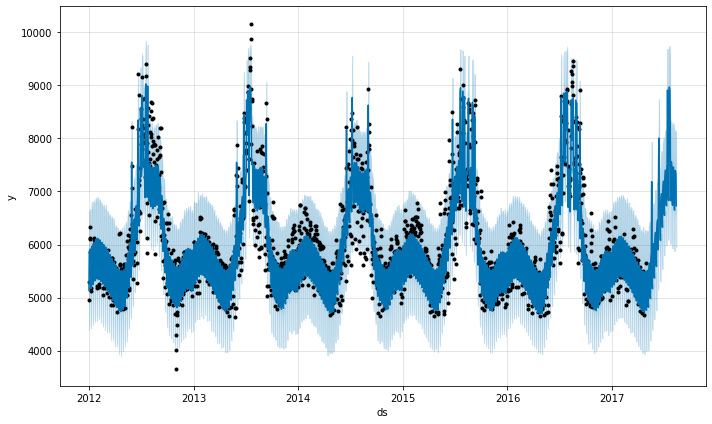

In [52]:
fig1 = model2.plot(forecast)
#95% Confidence interval is the light blue color
#the black dots are actual values 
#the dark blue is the y_hat or forecasted value

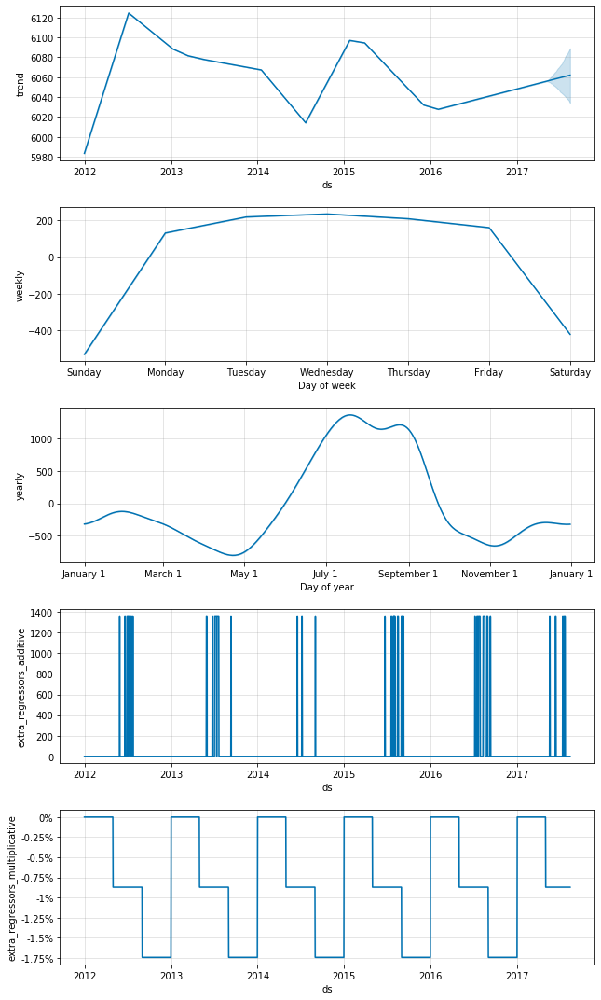

In [53]:
fig2 = model2.plot_components(forecast)

In [54]:
cv_results_m = cross_validation(model=model2 ,initial='731 days', horizon='365 days')
df_p_m = performance_metrics(cv_results_m)
df_p_m

INFO:fbprophet:Making 5 forecasts with cutoffs between 2014-05-01 00:00:00 and 2016-04-30 00:00:00


,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days 12:00:00,203049.515333,450.610159,351.157196,0.062282,0.050305,0.895604
1,37 days 00:00:00,209140.943793,457.319302,358.139787,0.063459,0.050463,0.884615
2,37 days 12:00:00,210335.709778,458.623713,360.362450,0.063831,0.051104,0.884615
3,38 days 00:00:00,214410.731435,463.045064,364.312658,0.064225,0.052596,0.879121
4,38 days 12:00:00,216550.544113,465.349916,368.068577,0.064819,0.053645,0.879121
...,...,...,...,...,...,...,...
653,363 days 00:00:00,152704.690224,390.774475,328.526155,0.060120,0.059339,0.983516
654,363 days 12:00:00,153120.767012,391.306487,328.237813,0.060069,0.059339,0.983516
655,364 days 00:00:00,156128.429944,395.130902,330.934519,0.060773,0.060068,0.978022
656,364 days 12:00:00,155572.525228,394.426831,329.746631,0.060579,0.059665,0.978022


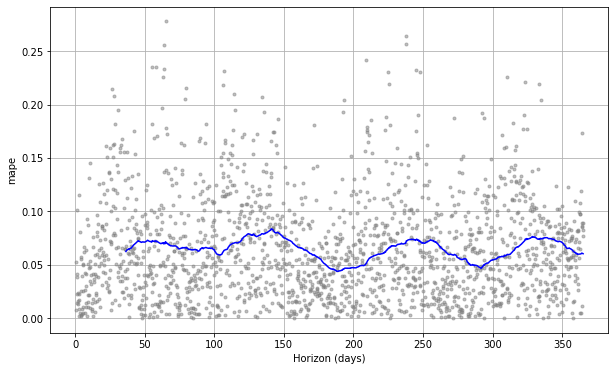

In [55]:
from fbprophet.plot import plot_cross_validation_metric
fig3 = plot_cross_validation_metric(cv_results_m, metric='mape')

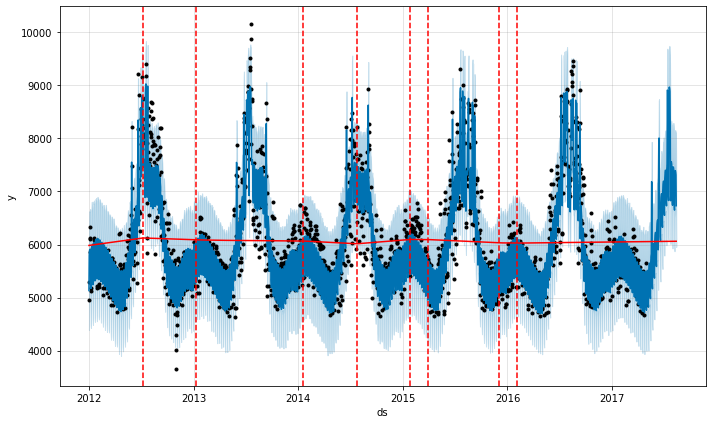

In [56]:
fig = model2.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model2, forecast)

In [57]:
deltas = model2.params['delta'].mean(0)
deltas

array([ 6.55938063e-07, -2.53337238e-05, -1.81639925e-01, -1.96552594e-07,
        6.80858705e-07,  1.66539139e-02,  9.60140472e-03,  2.50428626e-03,
        1.08361331e-04,  1.34119869e-06, -7.92747718e-09, -4.60730223e-02,
       -8.39288406e-06,  1.82954101e-07,  1.39692789e-01,  5.62663295e-06,
       -1.88422080e-11, -9.29452735e-02, -4.03849042e-02, -6.51531715e-07,
        1.44451915e-07,  7.59708188e-07,  3.46337285e-02,  2.52308222e-02,
        8.98047527e-08])

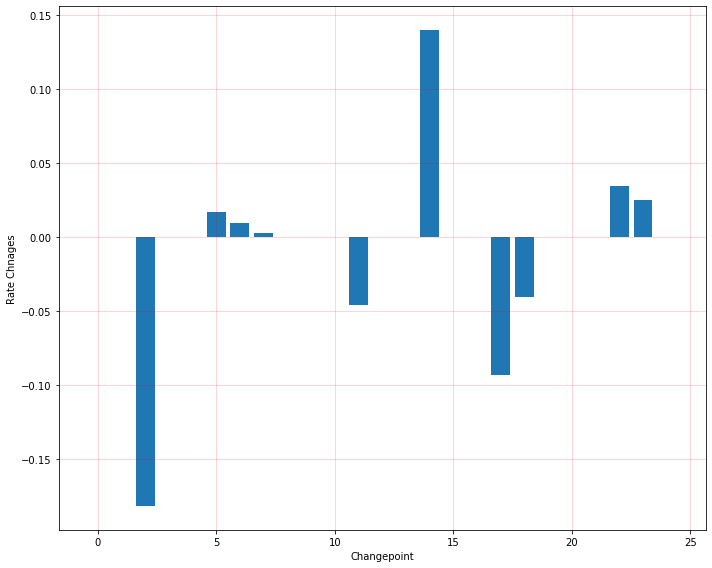

In [58]:
fig = plt.figure(facecolor='w')
ax = fig.add_subplot(111)
ax.bar(range(len(deltas)), deltas)
ax.grid(True, which='major', c='red', ls='-', alpha=0.2)
ax.set_ylabel('Rate Chnages')
ax.set_xlabel('Changepoint')
fig.tight_layout()
#Prophet plots around 25 chnage points

Adding temperature and feature engineering definitely boosted the model performance.